In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow #For image display
from skimage import io
import matplotlib.pyplot as plt

In [ ]:
cv.__version__

'4.1.2'

In [ ]:
# Create a list to store the urls of the images
urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
       "https://iiif.lib.ncsu.edu/iiif/0016007/full/800,/0/default.jpg",
      "https://placekitten.com/800/571"]  
# Read and display the image

For a single Image

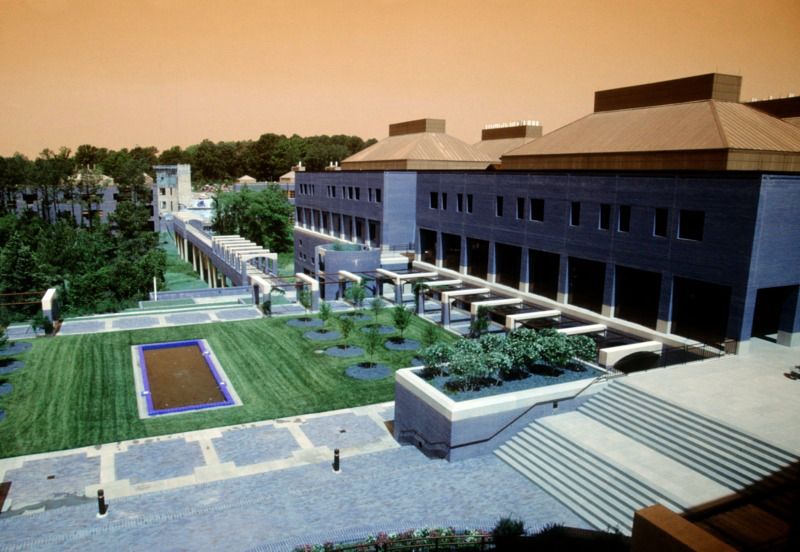

In [ ]:
image = io.imread(urls[0]) 
cv2_imshow(image)

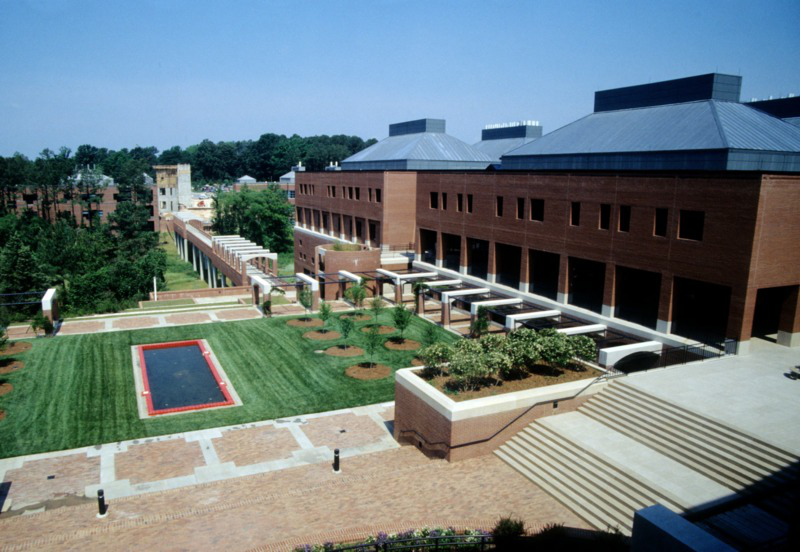

In [ ]:
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
cv2_imshow(image_2)

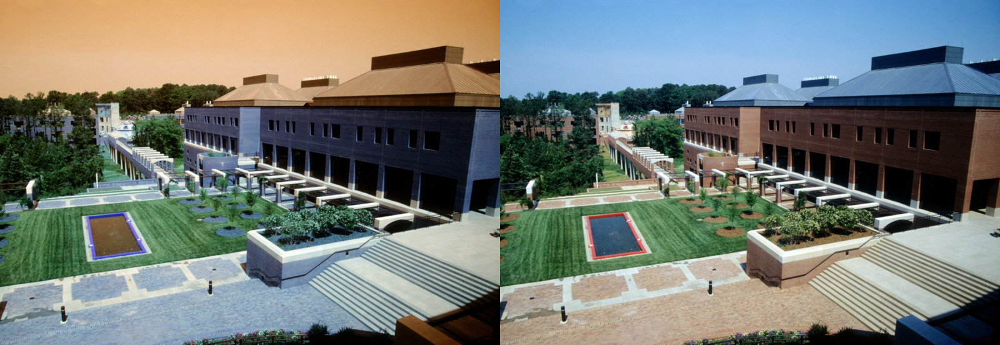

In [ ]:
final_frame = cv.hconcat((image, image_2))
cv2_imshow(final_frame)

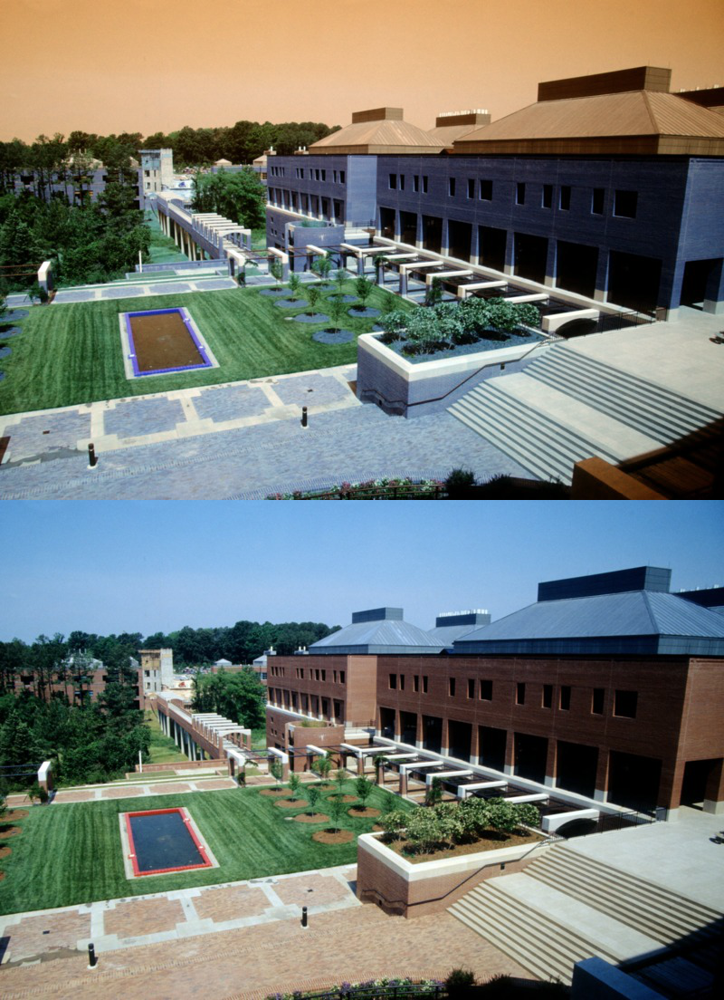

In [ ]:
final_frame = cv.vconcat((image, image_2))
cv2_imshow(final_frame)

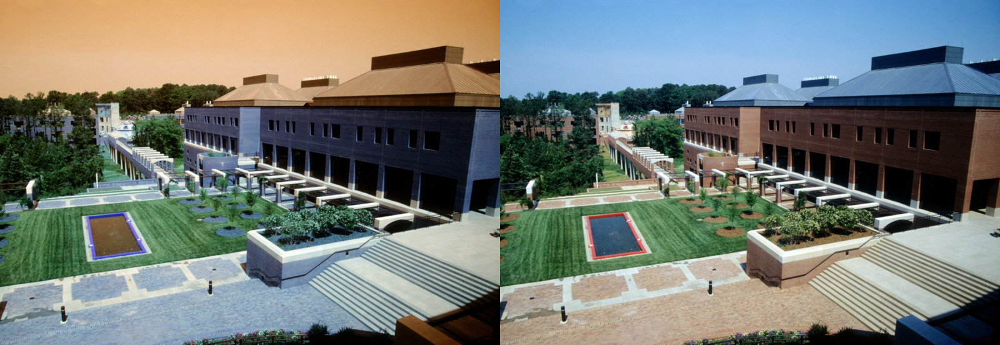

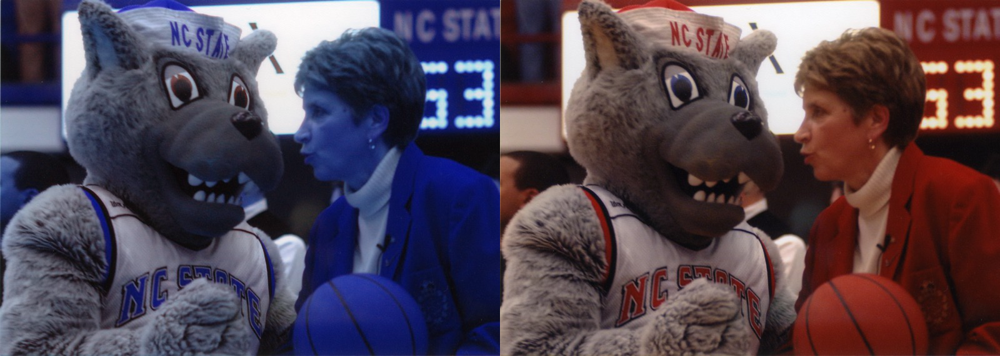

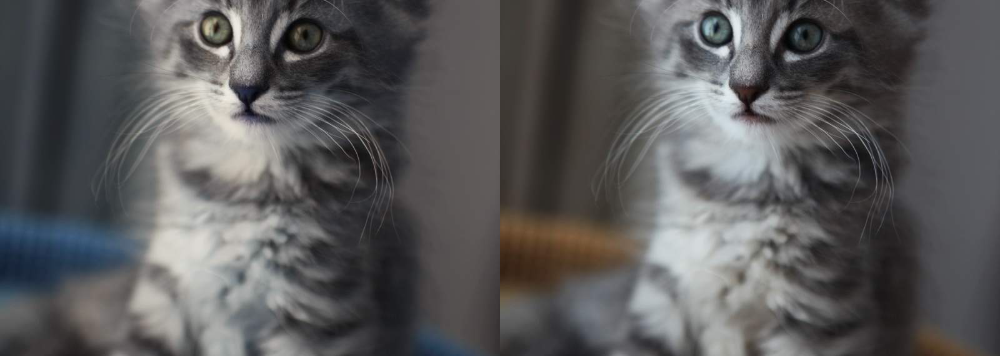

In [ ]:
for url in urls:
  image = io.imread(url) 
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')

##Step3: Image Contours and Histograms

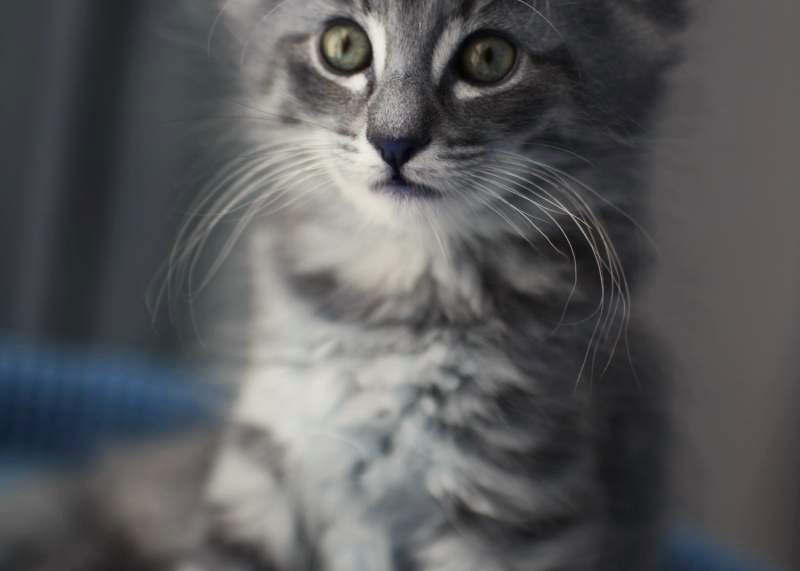

In [ ]:
cv2_imshow(image)

In [ ]:
# Check the image matrix data type (could know the bit depth of the image)
print(image.dtype)
# Check the height of image 
print(image.shape[0])
# Check the width of image 
print(image.shape[1])
# Check the number of channels of the image
print(image.shape[2])

uint8
571
800
3


## Generate Histogram of color image and grayscale image

In [ ]:
image

array([[[64, 61, 56],
        [64, 61, 56],
        [64, 61, 56],
        ...,
        [90, 91, 95],
        [90, 91, 95],
        [90, 91, 95]],

       [[64, 61, 56],
        [64, 61, 56],
        [64, 61, 56],
        ...,
        [90, 91, 95],
        [90, 91, 95],
        [90, 91, 95]],

       [[64, 61, 56],
        [64, 61, 56],
        [64, 61, 56],
        ...,
        [90, 91, 95],
        [90, 91, 95],
        [90, 91, 95]],

       ...,

       [[47, 43, 42],
        [47, 43, 42],
        [47, 43, 42],
        ...,
        [52, 52, 52],
        [51, 51, 51],
        [51, 51, 51]],

       [[47, 43, 42],
        [47, 43, 42],
        [47, 43, 42],
        ...,
        [52, 52, 50],
        [51, 51, 49],
        [51, 51, 49]],

       [[47, 43, 42],
        [47, 43, 42],
        [47, 43, 42],
        ...,
        [52, 52, 50],
        [51, 51, 49],
        [51, 51, 49]]], dtype=uint8)

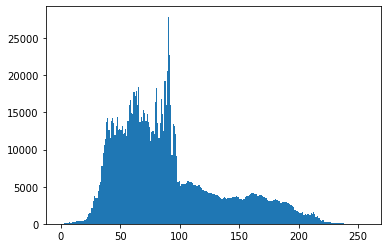

In [ ]:
plt.hist(image.ravel(),bins = 256, range = [0,256]) 
plt.show()

Display the histogram of R, G, B channel We could observe that the green channel has many pixels in 255, which represents the white patch in the image

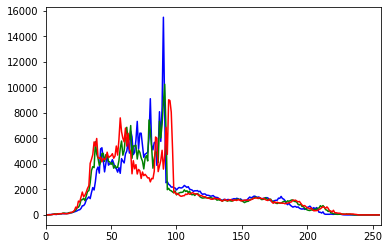

In [ ]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

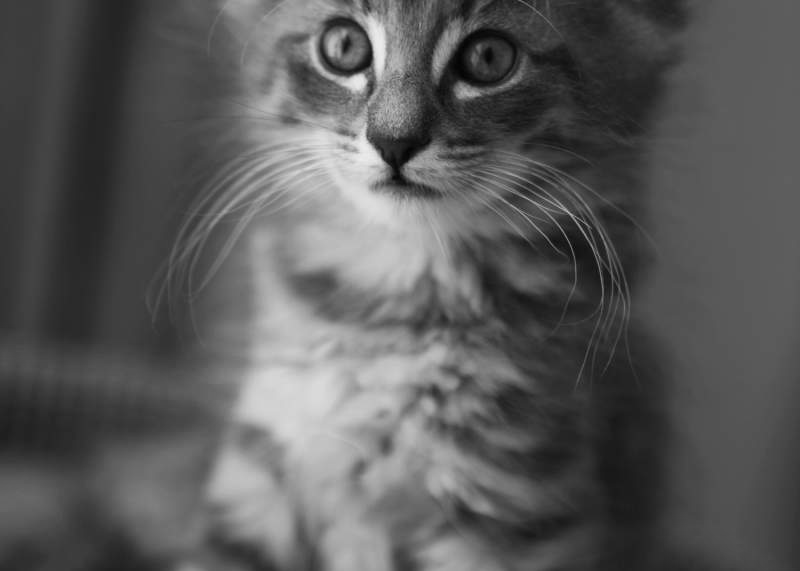

In [ ]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

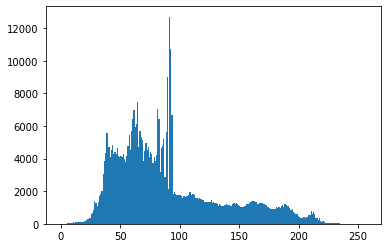

In [ ]:
# Plot the histogram of the gray image. We could observe that the frequency of
# the image hist has decreased ~ 1/3 of the histogram of color image
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

###Find image contour of the grayscale image

Method 1: Use the matplotlib. contour

More Info: [matplotlib contour](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.contour.html)

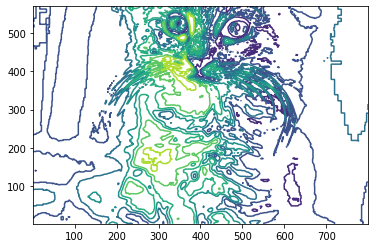

In [ ]:
plt.contour(gray_image, origin = "image")

##Step4: Grayscale Transform and Histogram Equalization


####Grayscale Transformation

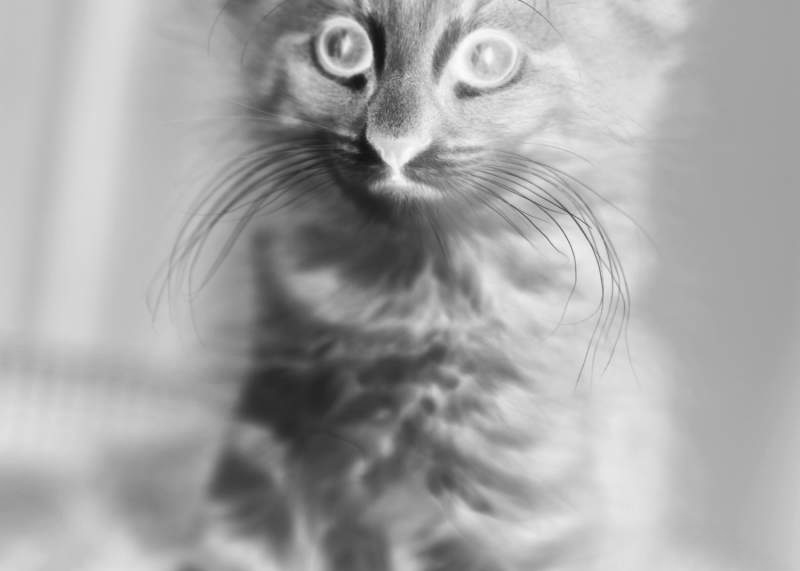

In [ ]:
# This is an inverse operation of the grayscale image, you could see that the
# bright pixels become dark, and the dark pixels become bright
im2 = 255 - gray_image
cv2_imshow(im2)

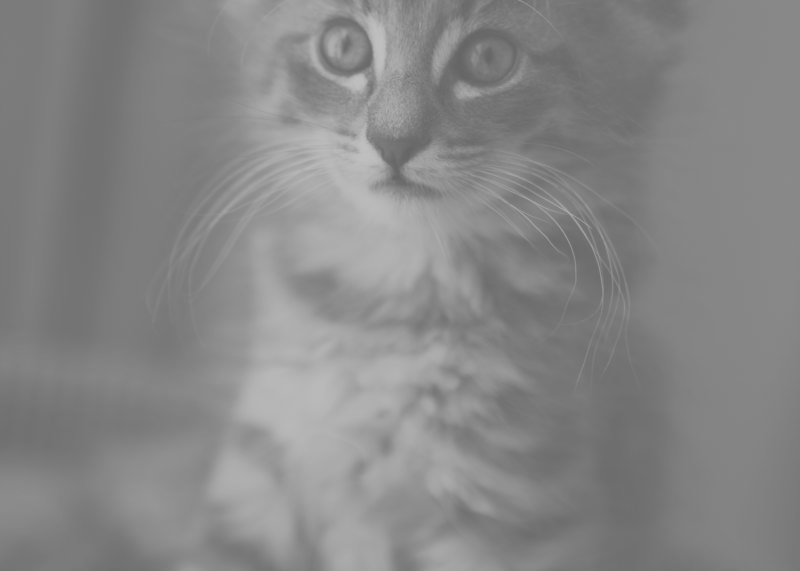

In [ ]:
# Another transform of the image, after adding a constant, 
# all the pixels become brighter and a hazing-like effect of the image is generated
im3 = (100.0/255)*gray_image + 100
cv2_imshow(im3)

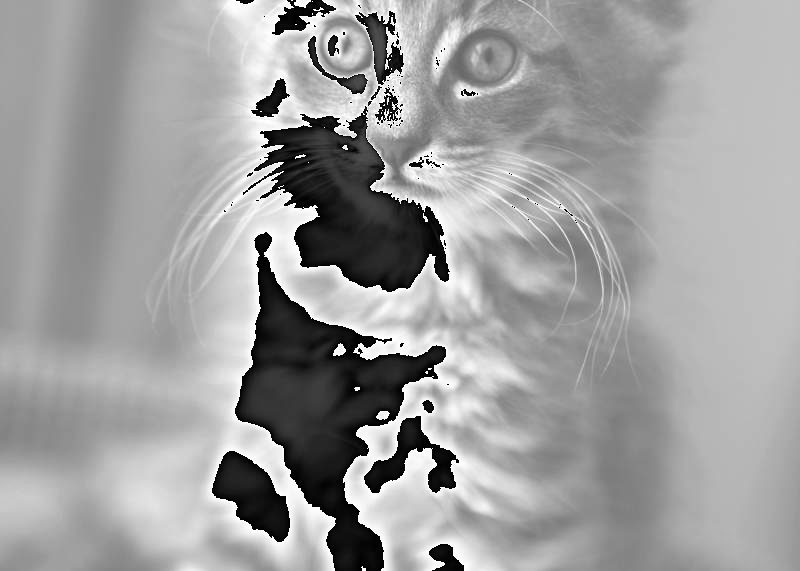

In [ ]:
im4 = gray_image + 100
cv2_imshow(im4)

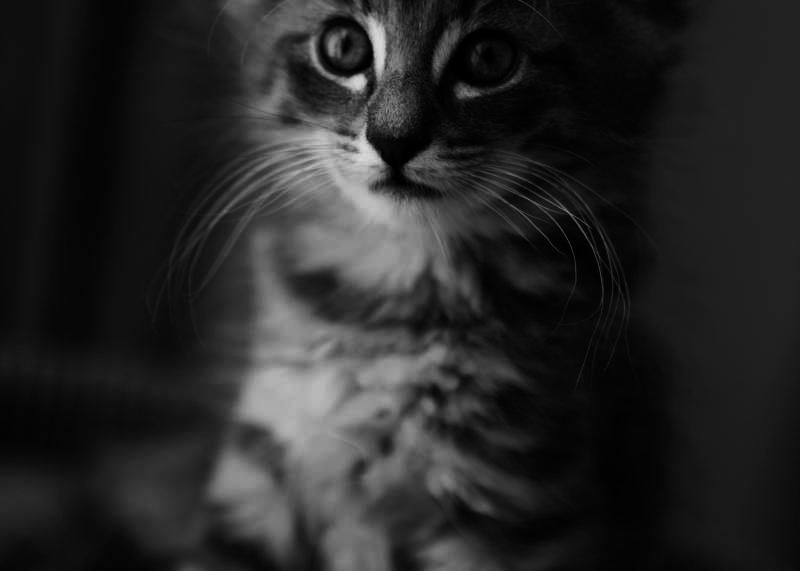

In [ ]:
# The lightness level of the gray_image decreases after this step
im5 = 255.0*(gray_image/255.0)**2
cv2_imshow(im5)

###Histogram Equalization

In [ ]:
imhist, bins = np.histogram(im5.flatten(), 256, [0, 256])
imhist, bins

(array([  947,  1144,  2791,  5085,  8598, 19287, 13327, 13555,  8959,
        12385,  8378, 11941, 10207, 10208, 13405, 12037, 12142, 11050,
         9019,  9406,  9219,  4101,  8671,  7856,  3832, 11287,  6416,
         7824,  4752,  8067,  5645, 11164, 12706, 17409,  1841,  1955,
         3598,  1782,  1749,  1743,  3316,  1718,  1667,  1710,  3474,
         1936,  1757,  1809,  1834,  1741,  3167,  1534,  1613,  1552,
         1497,  1448,  1316,  1340,  1324,  1364,  1334,  1318,  1441,
         1292,  1336,  1287,  1266,  1245,  1091,  1219,  1156,  1062,
         1106,  1170,  1134,  1194,  1128,  1132,     0,  1095,  1107,
         1189,  1292,  1198,  1256,  1218,     0,  1130,  1111,  1044,
         1012,  1043,     0,  1090,  1098,  1221,  1221,  1301,     0,
         1339,  1378,  1424,  1390,     0,  1307,  1324,  1242,     0,
         1216,  1248,  1260,     0,  1292,  1187,  1208,     0,  1163,
         1017,  1002,     0,   984,   934,   923,     0,   911,   897,
      

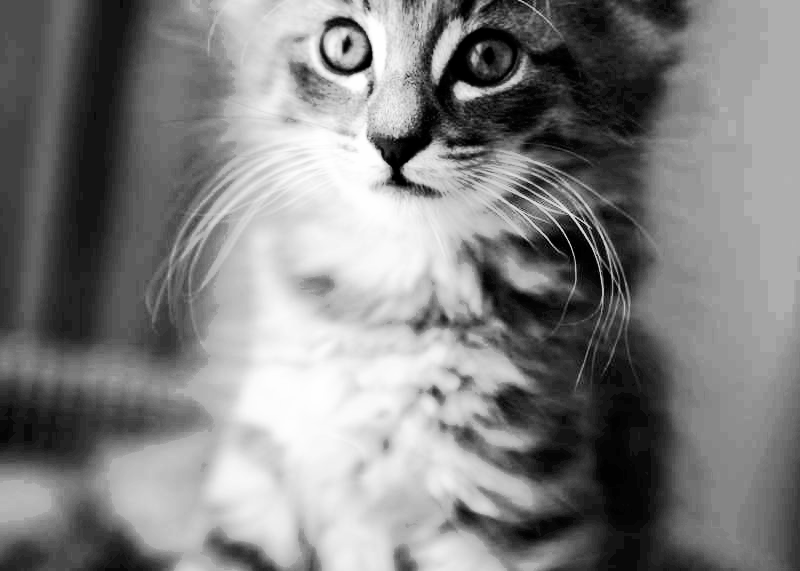

In [ ]:
# function of histogram equalization
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]

# apply the function on your dark image to increase the contrast
# we could observe that the contrast of the black background has increased
im6 = histeq(im5)
cv2_imshow(im6)

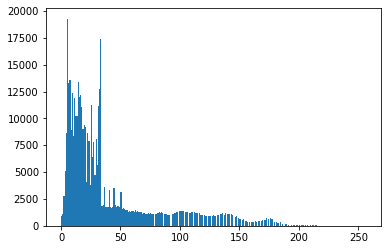

In [ ]:
# Extra: try to visualize the histogram of the image after histogram equalization
# Before histogram equalization
plt.hist(im5.ravel(),bins = 256, range = [0, 256])
plt.show()

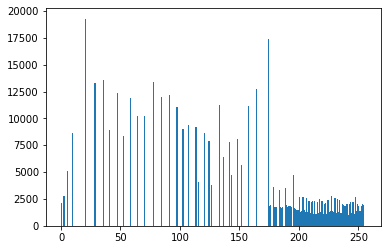

In [ ]:
# After histogram equalization
plt.hist(im6.ravel(),bins = 256, range = [0, 256])
plt.show()

#Step5: Fourier Transform of Gray Images

A fourier transform is used to find the frequency domian of an image. You can consider an image as a signal which is sampled in two directions. So taking a fourier transform in both X and Y directions gives you the frequency representation of image. For the sinusoidal signal, if the amplitude varies so fast in short time, you can say it is a high frequency signal. If it varies slowly, it is a low frequency signal. Edges and noises are high frequency contents in an image because they change drastically in images.

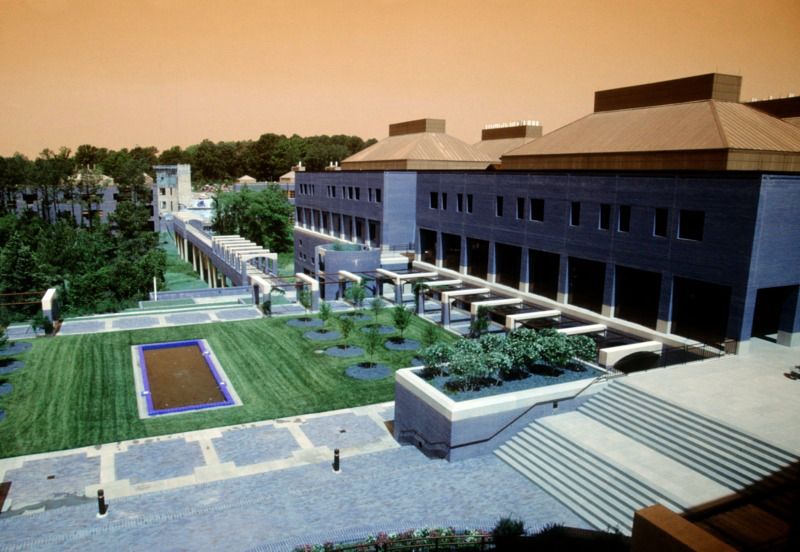

In [ ]:
image1 = io.imread(urls[0]) 
cv2_imshow(image1)

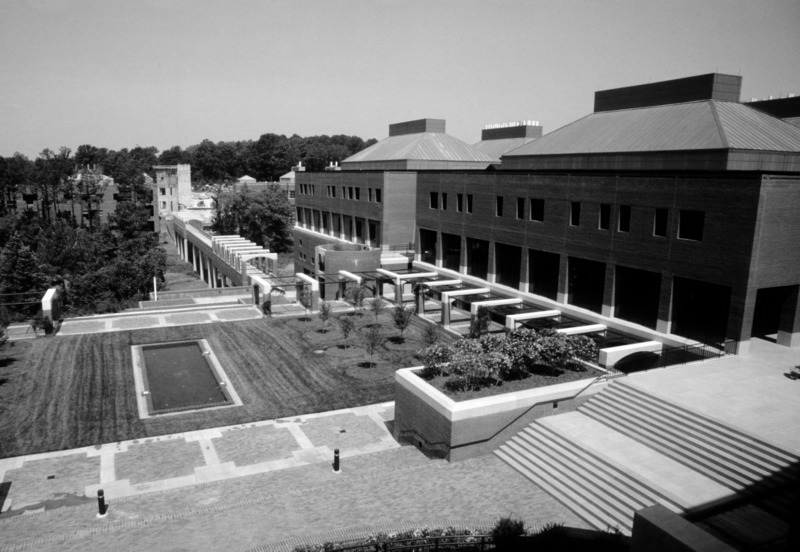

(552, 800)

In [ ]:
image1 = cv.cvtColor(image1, cv.COLOR_BGR2GRAY)
cv2_imshow(image1)

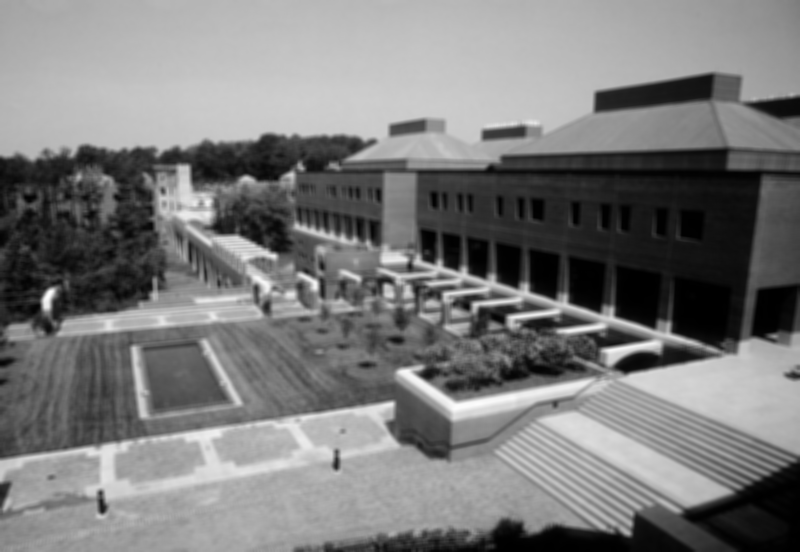

In [ ]:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(image1,(5,5))
cv2_imshow(imBlur)

-----------------